In [1]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# **Segmentation des données clients d'un site e-commerce**

## I- Preproessing

**1-Chargement des packages et fonctions**

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import datetime

**2- Chargement des données**

In [ ]:
# chargement des données
path1 = "/content/gdrive/My Drive/P4/olist_customers_dataset.csv"
path2 = "/content/gdrive/My Drive/P4/olist_geolocation_dataset.csv"
path3 = "/content/gdrive/My Drive/P4/olist_orders_dataset.csv"
path4 = "/content/gdrive/My Drive/P4/olist_order_payments_dataset.csv"
path5 = "/content/gdrive/My Drive/P4/olist_order_reviews_dataset.csv"
path6 = "/content/gdrive/My Drive/P4/olist_order_items_dataset.csv"
path7 = "/content/gdrive/My Drive/P4/olist_products_dataset.csv"
path8 = "/content/gdrive/My Drive/P4/product_category_name_translation.csv"
path9 = "/content/gdrive/My Drive/P4/olist_sellers_dataset.csv"
df_customers = pd.read_csv(path1)
df_geo=pd.read_csv(path2)
df_orders = pd.read_csv(path3)
df_orders_payments = pd.read_csv(path4)
df_review = pd.read_csv(path5)
df_order_items = pd.read_csv(path6)
df_products = pd.read_csv(path7)
df_products_category = pd.read_csv(path8)
df_sellers = pd.read_csv(path9)

**3-Visualisation de chaque database**

In [ ]:
df_customers.head(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [ ]:
df_geo.head(5)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [ ]:
df_orders.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [ ]:
df_orders_payments.head(5)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [ ]:
df_order_items.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [ ]:
df_review.head(5)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [ ]:
df_products.head(5)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [ ]:
df_products_category.head(5)

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [ ]:
df_sellers.head(5)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


**4-Fusion des databases**

In [ ]:
df1 = pd.merge(df_products , df_products_category, on = 'product_category_name', how = 'left')
df1 = df1.drop(columns = ['product_category_name']) 
df1.head(5)

,product_id,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares


In [ ]:
df_merge = pd.merge(df_orders,df_customers, on = 'customer_id')
df_merge = df_merge.merge(df_order_items, on = 'order_id')
df_merge = df_merge.merge(df_orders_payments, on = 'order_id')


In [ ]:
df_merge = df_merge.merge(df_review, on = 'order_id')
df_merge = df_merge.merge(df_sellers, on = 'seller_id')
df_merge.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,...,payment_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,seller_zip_code_prefix,seller_city,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,18.12,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,9350,maua,SP
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,2.00,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,9350,maua,SP
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,7c396fd4830fd04220f754e42b4e5bff,3149,...,18.59,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48,9350,maua,SP
3,8736140c61ea584cb4250074756d8f3b,ab8844663ae049fda8baf15fc928f47f,delivered,2017-08-10 13:35:55,2017-08-10 13:50:09,2017-08-11 13:52:35,2017-08-16 19:03:36,2017-08-23 00:00:00,02c9e0c05a817d4562ec0e8c90f29dba,8577,...,83.69,b8238c6515192f8129081e17dc57d169,5,NaN,"custo beneficio, simples de usar e rápido",2017-08-17 00:00:00,2017-08-21 12:43:27,9350,maua,SP
4,a0151737f2f0c6c0a5fd69d45f66ceea,fc2697314ab7fbeda62bb6f1afa4efcd,delivered,2017-07-12 14:11:58,2017-07-12 14:30:18,2017-07-13 12:47:05,2017-07-18 16:24:42,2017-07-25 00:00:00,bdd30e6e39cc70dde8665187b57af402,13820,...,52.77,fa5bf792d42ed25f80c54d18aeaa83de,4,NaN,NaN,2017-07-19 00:00:00,2017-07-24 13:59:59,9350,maua,SP


In [ ]:
df = df1.merge(df_merge, on = 'product_id')
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117329 entries, 0 to 117328
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   product_id                     117329 non-null  object 
 1   product_name_lenght            115634 non-null  float64
 2   product_description_lenght     115634 non-null  float64
 3   product_photos_qty             115634 non-null  float64
 4   product_weight_g               117309 non-null  float64
 5   product_length_cm              117309 non-null  float64
 6   product_height_cm              117309 non-null  float64
 7   product_width_cm               117309 non-null  float64
 8   product_category_name_english  115609 non-null  object 
 9   order_id                       117329 non-null  object 
 10  customer_id                    117329 non-null  object 
 11  order_status                   117329 non-null  object 
 12  order_purchase_timestamp      

* Suppression des doublons

In [ ]:
df.drop_duplicates(keep = 'first', inplace=True)
df.info(verbose = True) 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117329 entries, 0 to 117328
Data columns (total 39 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   product_id                     117329 non-null  object 
 1   product_name_lenght            115634 non-null  float64
 2   product_description_lenght     115634 non-null  float64
 3   product_photos_qty             115634 non-null  float64
 4   product_weight_g               117309 non-null  float64
 5   product_length_cm              117309 non-null  float64
 6   product_height_cm              117309 non-null  float64
 7   product_width_cm               117309 non-null  float64
 8   product_category_name_english  115609 non-null  object 
 9   order_id                       117329 non-null  object 
 10  customer_id                    117329 non-null  object 
 11  order_status                   117329 non-null  object 
 12  order_purchase_timestamp      

**Réagencement de la colonne 'order_purchase_timestamp'**

Conversion de la colonne 'order_purchase_timestamps' au format datetime et création de colonnes 'year', 'month', 'day' pour faciliter la navigation dans le dataset

* Suppression des lignes avec valeur manquanques

In [ ]:
df.dropna(axis = 0, how = 'any', inplace = True)
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11578 entries, 0 to 117328
Data columns (total 39 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   product_id                     11578 non-null  object 
 1   product_name_lenght            11578 non-null  float64
 2   product_description_lenght     11578 non-null  float64
 3   product_photos_qty             11578 non-null  float64
 4   product_weight_g               11578 non-null  float64
 5   product_length_cm              11578 non-null  float64
 6   product_height_cm              11578 non-null  float64
 7   product_width_cm               11578 non-null  float64
 8   product_category_name_english  11578 non-null  object 
 9   order_id                       11578 non-null  object 
 10  customer_id                    11578 non-null  object 
 11  order_status                   11578 non-null  object 
 12  order_purchase_timestamp       11578 non-null

In [ ]:
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])
df['year']= df['order_purchase_timestamp'].dt.year
df['month']= df['order_purchase_timestamp'].dt.month
df['day']= df['order_purchase_timestamp'].dt.day
df['order_purchase_timestamp'].head(10)


0    2018-04-24 16:16:53
3    2018-08-03 08:55:50
38   2018-06-26 14:27:52
39   2018-06-26 14:27:52
46   2018-05-11 13:28:31
51   2018-08-06 17:46:34
53   2018-05-07 23:25:09
58   2018-06-20 22:06:06
59   2018-06-20 22:06:06
60   2018-06-20 22:06:06
Name: order_purchase_timestamp, dtype: datetime64[ns]

**Fusion des données de géolocation**

In [ ]:
df_geo=df_geo.dropna(axis = 0)


In [ ]:
# Add geolocation information
df_customers = pd.merge(df_geo, df,
                        right_on=["customer_zip_code_prefix",
                                  "customer_city", "customer_state"],
                        left_on=["geolocation_zip_code_prefix",
                                 "geolocation_city", "geolocation_state"],
                        how="right")
df_customers.drop(["geolocation_zip_code_prefix", "geolocation_city",
                   "geolocation_state"], axis=1, inplace=True)
df_customers = df_customers[["customer_id", "customer_unique_id",
                             "customer_city", "geolocation_lat",
                             "geolocation_lng"]]
df_customers.columns = ["customer_id", "customer_unique_id",
                        "customer_city", "customer_latitude",
                        "customer_longitude"]
df_customers.head()

,customer_id,customer_unique_id,customer_city,customer_latitude,customer_longitude
0,f8a3e963a310aa58b60a5b1fed5bceb5,b1a1199364a4a7fe27c4486ab63f550d,mogi-guacu,-22.342774,-46.927142
1,f8a3e963a310aa58b60a5b1fed5bceb5,b1a1199364a4a7fe27c4486ab63f550d,mogi-guacu,-22.354149,-46.918990
2,f8a3e963a310aa58b60a5b1fed5bceb5,b1a1199364a4a7fe27c4486ab63f550d,mogi-guacu,-22.322905,-46.922931
3,f8a3e963a310aa58b60a5b1fed5bceb5,b1a1199364a4a7fe27c4486ab63f550d,mogi-guacu,-22.355575,-46.917066
4,f8a3e963a310aa58b60a5b1fed5bceb5,b1a1199364a4a7fe27c4486ab63f550d,mogi-guacu,-22.343334,-46.933038


In [ ]:
df_customers.drop_duplicates(subset="customer_unique_id", 
                             inplace=True)

In [ ]:
df_sellers = pd.merge(df_geo, df,
                        right_on=["seller_zip_code_prefix",
                                  "seller_city",
                                  "seller_state"],
                        left_on=["geolocation_zip_code_prefix",
                                 "geolocation_city",
                                 "geolocation_state"],
                        how="right")
df_sellers.drop(["geolocation_zip_code_prefix",
                 "geolocation_city",
                 "geolocation_state"], axis=1, inplace=True)
df_sellers = df_sellers[['seller_id',
                         "geolocation_lat",
                         "geolocation_lng"]]
df_sellers.columns = ["seller_id",
                      "seller_latitude",
                      "seller_longitude"]

In [ ]:
df_sellers.drop_duplicates(subset="seller_id", inplace=True)
df1 = pd.merge(df, df_customers, on="customer_id", how="left")
df1= pd.merge(df1, df_sellers, on="seller_id", how="left")
df1=df1.dropna(axis=0)

In [ ]:
df1['customer_unique_id']=df1['customer_unique_id_x']
df1['customer_city']=df1['customer_city_x']
df=df1.copy()

In [ ]:
df.isna().mean()

product_id                       0.0
product_name_lenght              0.0
product_description_lenght       0.0
product_photos_qty               0.0
product_weight_g                 0.0
product_length_cm                0.0
product_height_cm                0.0
product_width_cm                 0.0
product_category_name_english    0.0
order_id                         0.0
customer_id                      0.0
order_status                     0.0
order_purchase_timestamp         0.0
order_approved_at                0.0
order_delivered_carrier_date     0.0
order_delivered_customer_date    0.0
order_estimated_delivery_date    0.0
customer_unique_id_x             0.0
customer_zip_code_prefix         0.0
customer_city_x                  0.0
customer_state                   0.0
order_item_id                    0.0
seller_id                        0.0
shipping_limit_date              0.0
price                            0.0
freight_value                    0.0
payment_sequential               0.0
p

## II-Analyse descriptive

* **Cartographie des 30000 clients**

In [ ]:
import folium
map = folium.Map(location=[-23.546	, -46.639], zoom_start=10) # Seattle location
fille =df[['customer_latitude','customer_longitude']]
fille1 =df[['seller_latitude','seller_longitude']]
loc_list = fille.values.tolist()
loc_list1 = fille1.values.tolist()
for point in range(0, len(loc_list)):
    folium.Marker(loc_list[point],icon=folium.Icon(color='green') 
             ).add_to(map)
for point in range(0, len(loc_list1)):
    folium.Marker(loc_list1[point]).add_to(map)
map

**1-Analyse des données clients**

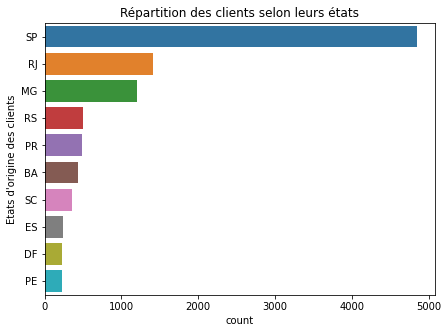

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(y="customer_state", data=df, order=df["customer_state"].value_counts().index[:10])
plt.title("Répartition des clients selon leurs états")
plt.ylabel("Etats d'origine des clients")
plt.show()

Un grand nombre de nos clients vit dans l'état de Sao Paolo. Il s'agit de l'état le plus peuplé du Brésil. Il pourrait être intéressant de faire un calcul en pondérant le nombre de clients sur le nombre d'habitants dans les différents états brésiliens.

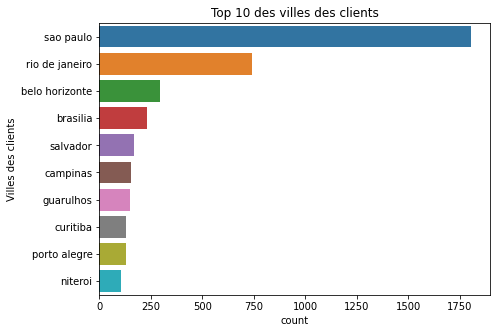

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(y="customer_city", data=df, order=df["customer_city"].value_counts().index[:10])
plt.title("Top 10 des villes des clients")
plt.ylabel("Villes des clients")
plt.show()

La majorité des clients vivent à Rio de Janeiro. Il s'agit de la seconde ville la plus peuplée du Brésil. Elle possède 8% de la population du pays. On observe qu'ensuite les clients vivent à Sao Paolo, qui est la ville la plus peuplée du pays. Enfin, en troisième position, on retrouve Belo Horizonte. Cette ville se situe dans l'état de Minas Gerais.

**2 - Analyses des commandes**

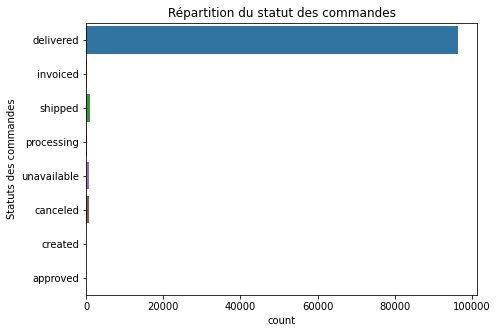

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(y="order_status", data=df_orders)
plt.title("Répartition du statut des commandes")
plt.ylabel("Statuts des commandes")
plt.show()

La plupart des commandes sont au statut "Réceptionné".

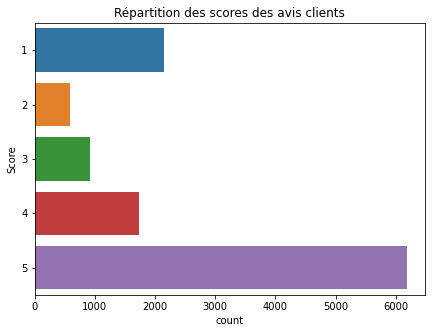

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(y="review_score", data=df)
plt.title("Répartition des scores des avis clients")
plt.ylabel("Score")
plt.show()

La majorité des clients a attribué la note maximale à leurs commandes (5). Il y a peu d'avis négatif.

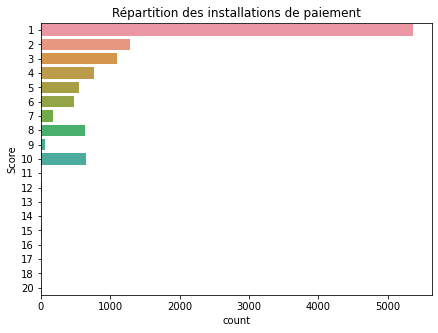

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(y="payment_installments", data=df)
plt.title("Répartition des installations de paiement")
plt.ylabel("Score")
plt.show()

Une majorité des vendeurs ne dispose que d'une seule installation de paiement. Peu de vendeurs disposent de 9 à 10 installations.

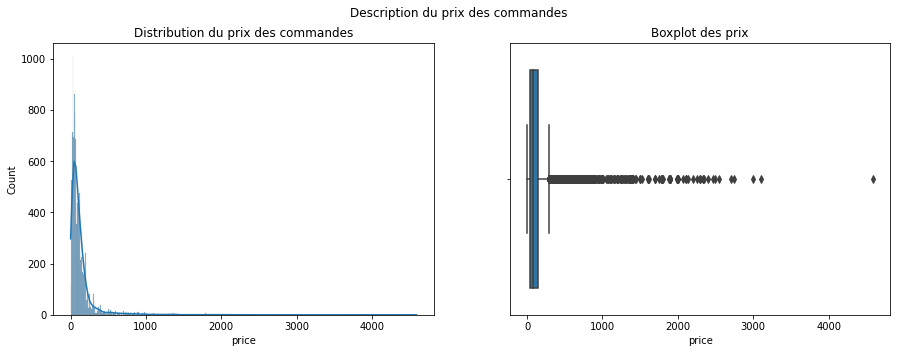

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
fig.suptitle('Description du prix des commandes')

sns.histplot(ax=axes[0],x="price", data=df, kde=True)
axes[0].set_title("Distribution du prix des commandes")

sns.boxplot(ax=axes[1], x="price", data=df)
axes[1].set_title("Boxplot des prix")

plt.show()

Les commandes sont comprises entre 0 et 7000 Réaux brésiliens. Le prix des commandes ne semblent pas suivre une loi normale.

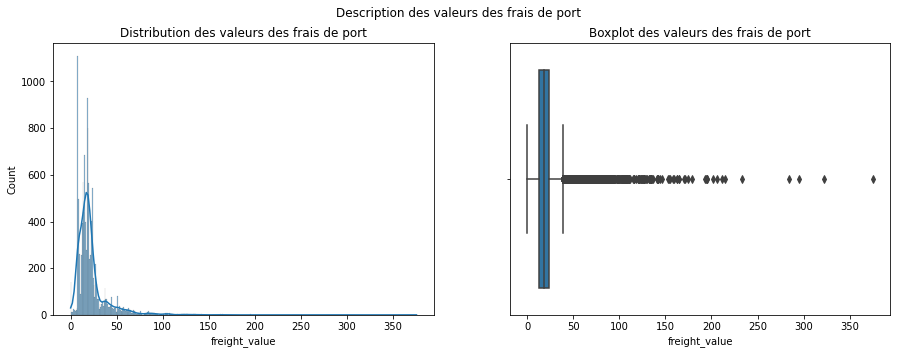

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
fig.suptitle('Description des valeurs des frais de port')

sns.histplot(ax=axes[0],x="freight_value", data=df, kde=True)
axes[0].set_title("Distribution des valeurs des frais de port")

sns.boxplot(ax=axes[1], x="freight_value", data=df)
axes[1].set_title("Boxplot des valeurs des frais de port")

plt.show()

La valeur des frais de port ne suit pas une loi normale. Les frais de port sont compris entre 0 et 400 Réaux brésiliens. 

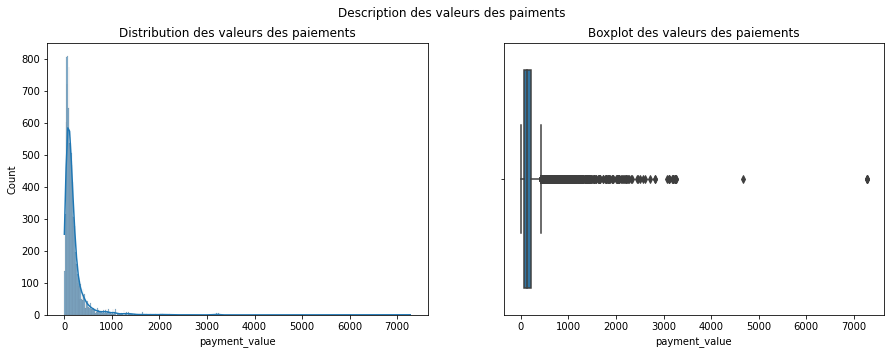

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
fig.suptitle('Description des valeurs des paiments')

sns.histplot(ax=axes[0],x="payment_value", data=df, kde=True)
axes[0].set_title("Distribution des valeurs des paiements")

sns.boxplot(ax=axes[1], x="payment_value", data=df)
axes[1].set_title("Boxplot des valeurs des paiements")

plt.show()

La valeur maximale des paiements est de 14 000 Réaux brésiliens.

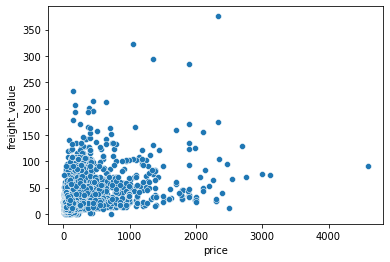

In [ ]:
sns.scatterplot(x="price", y="freight_value", data=df)
plt.show()

Il ne semble pas avoir de lien entre les prix des commandes et les frais de port.

**3 - Analyses des produits**

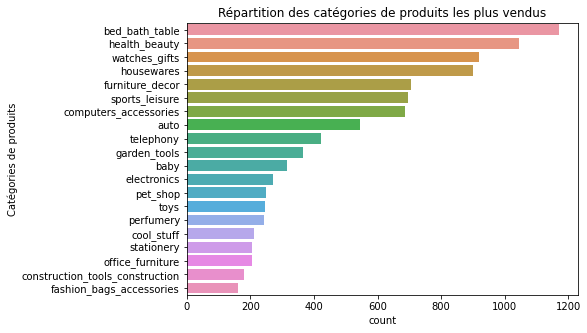

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(y="product_category_name_english", data=df, 
             order=df["product_category_name_english"].value_counts().index[:20])
plt.ylabel("Catégories de produits")
plt.title("Répartition des catégories de produits les plus vendus")
plt.show()

La catégorie la plus vendue est le linge de maison, suivie par les sports et loisirs et la décoration.

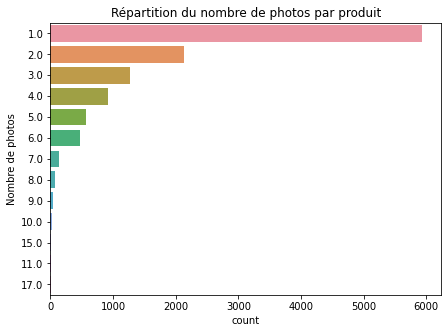

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(y="product_photos_qty", data=df,order=df["product_photos_qty"].value_counts().index)
plt.ylabel("Nombre de photos")
plt.title("Répartition du nombre de photos par produit")
plt.show()

En général, chaque produit est accompagné par une photo. Certains produits ont jusqu'à 11 photos.

**4 - Analyse des vendeurs**

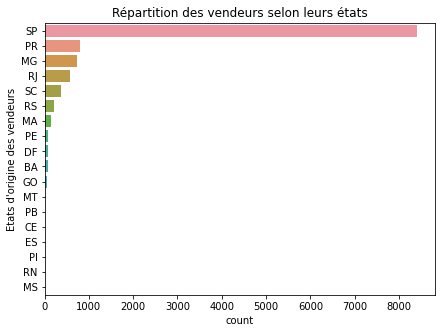

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(y="seller_state", data=df, order=df["seller_state"].value_counts().index)
plt.title("Répartition des vendeurs selon leurs états")
plt.ylabel("Etats d'origine des vendeurs")
plt.show()

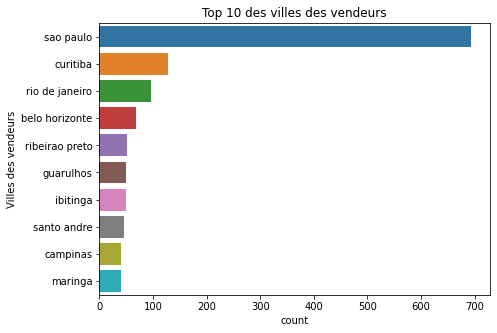

In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(y="seller_city", data=df_sellers, order=df_sellers["seller_city"].value_counts().index[:10])
plt.title("Top 10 des villes des vendeurs")
plt.ylabel("Villes des vendeurs")
plt.show()

 **5 - Analyses des produits et des ventes**

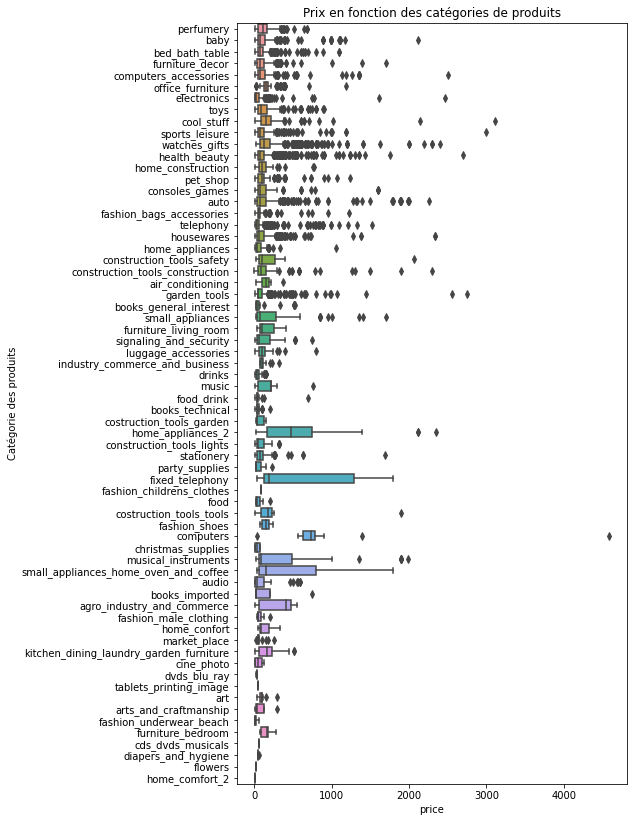

In [ ]:
plt.figure(figsize=(7, 14))
sns.boxplot(x="price", y="product_category_name_english", data=df)
plt.ylabel("Catégorie des produits")
plt.title("Prix en fonction des catégories de produits")
plt.show()

**6-Répartition des achats en 2018**

Text(0.5, 1.0, 'Répartition des achats en 2018')

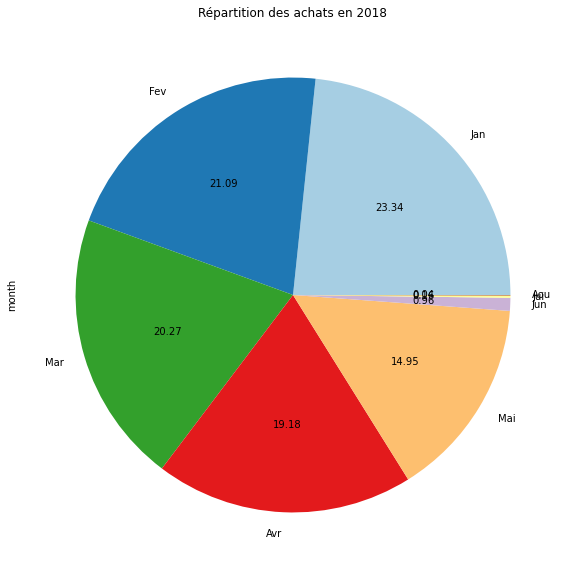

In [ ]:
df_2017 = df[df['year'] == 2018]

s = df_2017['month'].value_counts()
labels = ['Jan','Fev','Mar','Avr','Mai','Jun','Jui','Aou','Sep','Oct','Nov','Dec']

s.plot.pie(y = df_2017,colormap = 'Paired',labels = labels,figsize = (10,10),autopct='%.2f')
plt.title('Répartition des achats en 2018')

Les achats sont plus nombreux pendant le mois de janvier.

In [ ]:
# Selection des colonnes utiles pour la classification RFM

df1 = df[['product_category_name_english', 'customer_id','order_id',"customer_city", 
          'order_purchase_timestamp',"order_approved_at","order_delivered_carrier_date", "order_delivered_customer_date",
        "order_estimated_delivery_date",'customer_unique_id', 'price', 'payment_value',
          'year', 'month', 'day','review_score','customer_latitude', 'customer_longitude', 'seller_latitude','seller_longitude']]
df1.head()

,product_category_name_english,customer_id,order_id,customer_city,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,price,payment_value,year,month,day,review_score,customer_latitude,customer_longitude,seller_latitude,seller_longitude
0,perfumery,f8a3e963a310aa58b60a5b1fed5bceb5,e17e4f88e31525f7deef66779844ddce,mogi-guacu,2018-04-24 16:16:53,2018-04-24 19:04:19,2018-04-25 17:01:00,2018-04-27 16:42:17,2018-05-09 00:00:00,b1a1199364a4a7fe27c4486ab63f550d,10.91,18.30,2018,4,24,5,-22.342774,-46.927142,-23.537922,-46.477696
1,baby,322162b5ca010c2b059cb5224dd818b1,143d00a4f2dde4e0364ee1821577adb3,sao paulo,2018-08-03 08:55:50,2018-08-03 09:31:42,2018-08-03 11:48:00,2018-08-06 15:14:32,2018-08-08 00:00:00,619e926d09b26efbd5180368b1ddc874,112.30,121.84,2018,8,3,1,-23.493511,-46.631067,-23.089035,-47.214419
2,bed_bath_table,d436890d44092b00fcfcbdd7a168c240,a4425e2bccba621150a07a685cf063be,sao paulo,2018-06-26 14:27:52,2018-06-26 14:57:15,2018-06-27 11:31:00,2018-06-29 16:18:52,2018-07-18 00:00:00,ed42ccde391485cde5b0699b84b5c070,41.99,111.72,2018,6,26,5,-23.599568,-46.666486,-21.766477,-48.831547
3,bed_bath_table,d436890d44092b00fcfcbdd7a168c240,a4425e2bccba621150a07a685cf063be,sao paulo,2018-06-26 14:27:52,2018-06-26 14:57:15,2018-06-27 11:31:00,2018-06-29 16:18:52,2018-07-18 00:00:00,ed42ccde391485cde5b0699b84b5c070,41.99,111.72,2018,6,26,5,-23.599568,-46.666486,-21.766477,-48.831547
4,furniture_decor,ac8d05674efe12528f6d96c507aac3bc,0a4581df52d24b72b87ae0feb1b11d08,florianopolis,2018-05-11 13:28:31,2018-05-11 13:50:45,2018-05-15 16:11:00,2018-05-21 16:52:07,2018-05-30 00:00:00,4148cb4b02695af300af0674b9b3a723,79.90,98.04,2018,5,11,5,-27.615683,-48.587666,-25.472735,-49.305638


In [ ]:
# Sauvegarde d'une db intermédiaire

df_i = df1.to_csv('db_inter_avant_RFM.csv',index=False)


In [ ]:
df2 = pd.read_csv('db_inter_avant_RFM.csv')


## III-Création de la segmentation RFM

On va créer une segmentation RFM (Recency, Frequency, MonetaryValue). Ce type de segmentation est utilisé en marketing pour pouvoir découper les clients en segments actionnables et ainsi adapter les stratégies en fonction du type de client. La segmentation RFM se base sur des habitudes de consommations comme la date du dernier achat (Recency), la fréquence d'achat (Frequency) et la valeur moyenne/la somme moyenne dépensée lors d'une commande (MonetaryValue).

In [ ]:
# Creation of RFM segmentation
df2['order_purchase_timestamp']=pd.to_datetime(df2['order_purchase_timestamp'])
snapshot_date = max(df2.order_purchase_timestamp) + datetime.timedelta(days=1)

rfm_custom = df2.groupby("customer_id").agg({
    "order_purchase_timestamp" : lambda x: (snapshot_date - x.max()).days,
    "order_id" : 'count',
    "payment_value" : "sum"
})
rfm_custom.columns = ["Recency", "Frequency", "MonetaryValue"]
data = rfm_custom.copy().reset_index()


In [ ]:
data.head(5)

,customer_id,Recency,Frequency,MonetaryValue
0,001051abfcfdbed9f87b4266213a5df1,92,3,65.20
1,0013cd8e350a7cc76873441e431dd5ee,114,1,92.60
2,0015bc9fd2d5395446143e8b215d7c75,79,1,132.19
3,0018c09f333634ca9c80d9ff46e43e9c,59,1,56.87
4,001df1ee5c36767aa607001ab1a13a06,24,1,42.86


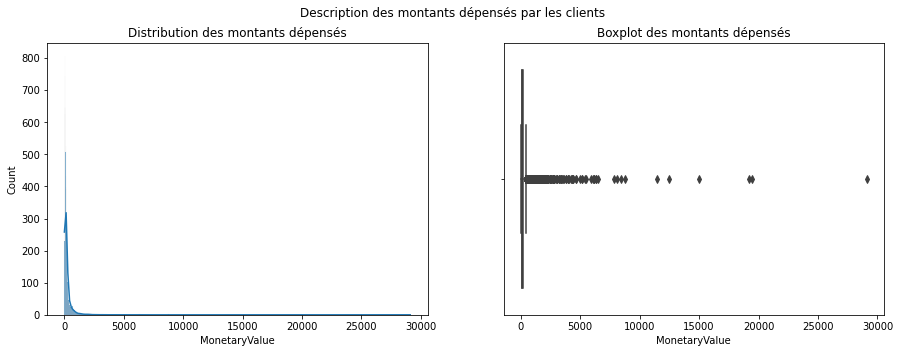

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
fig.suptitle('Description des montants dépensés par les clients')

sns.histplot(ax=axes[0],x="MonetaryValue", data=data, kde=True)
axes[0].set_title("Distribution des montants dépensés")

sns.boxplot(ax=axes[1], x="MonetaryValue", data=data)
axes[1].set_title("Boxplot des montants dépensés")

plt.show()

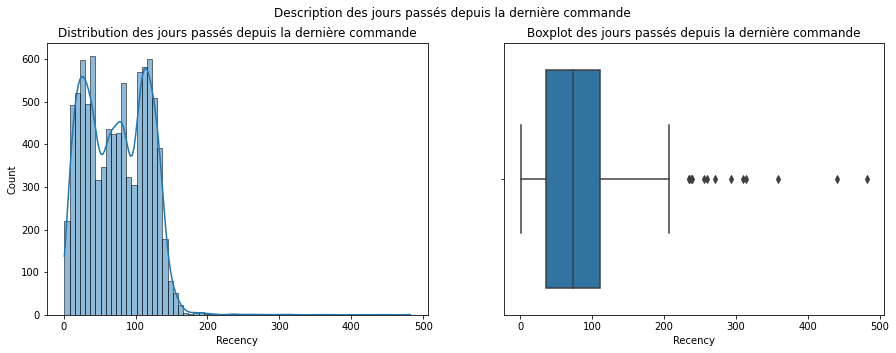

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharex=True)
fig.suptitle('Description des jours passés depuis la dernière commande')

sns.histplot(ax=axes[0],x="Recency", data=data, kde=True)
axes[0].set_title("Distribution des jours passés depuis la dernière commande")

sns.boxplot(ax=axes[1], x="Recency", data=data)
axes[1].set_title("Boxplot des jours passés depuis la dernière commande")

plt.show()

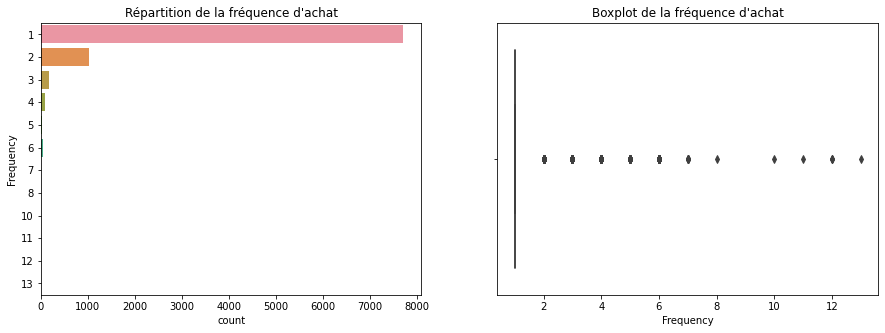

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sns.countplot(ax=axes[0],y="Frequency", data=data)
plt.ylim(23)
axes[0].set_title("Répartition de la fréquence d'achat")

sns.boxplot(ax=axes[1], x="Frequency", data=data)
axes[1].set_title("Boxplot de la fréquence d'achat")

plt.show()

In [ ]:
rfm_df=data.to_csv('RFM.csv',index=False)


## Conclusion

La fréquence et la récence ne semblent pas être très discriminants. En effet, la plupart des clients réalise un seul achat. De même, il est difficile de savoir s'ils reviennent régulièrement acheter donc la récence est très variable. Les sommes dépensées atteignent un maximum de 14.000 Réaux. 

En inspectant le fonctionnement du site, il s'avère que l'on peut commander sans avoir besoin de créer un compte. On ne peut donc pas savoir si une personne commande plusieurs fois et obtenir les informations nécessaires. Il pourrait être intéressant d'instaurer un système de compte pour obtenir des informations plus stables sur la récence et la fréquence. A défaut, un système de cookies pouvant "tracker" (tout en respectant les législations en vigueur) peut être une solution permettant de remédier à ce problème. 